In [2]:
import graph_tool.all as gt
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

# Statistical Inference with `graph-tool`

This notebook provides an introduction to statistical inference using the `graph-tool` library in Python. It also provides a gentle introduction the minimum description length (MDL) principle, as some motivation for the use of these methods.

Like all of the contents in this repository, this code is highly redundant, and there's no substitute for the [graph-tool cookbook](https://graph-tool.skewed.de/static/doc/cookbook.html). Moreover, using and understanding these methods in a scientific context requires a deep understanding of the underlying statistical principles, and there is no substitute for reading the various publications on which these methods are based. Nevertheless, this notebook provides a gentle introduction to the use of `graph-tool` for statistical inference, and it is hoped that it will be useful for those who are new to the library/methods.

# A brief introduction to Bayesian generative models and the minimum description length (MDL) principle

Imagine you have some data, which we'll call $\mathbf{\mathcal{D}}$. 
The process of quantitative science is to use this data to learn something about the world, which we do using statistical models.
These can be simple, like a linear regression, or complex, like a deep neural network.

In the Bayesian framework, we assume that the data is generated by some underlying random process, which we call the "generative model".
These models depend on some parameters, which we denote as $\boldsymbol{\theta}$.
In most real-world applications, the generative model is not known exactly, so instead we have to assume the model falls within some class of models.
In other words, we are trying to infer which parameters $\boldsymbol{\theta}$ are most likely to have generated the data $\mathbf{\mathcal{D}}$.
The probability of a particular set of parameters have generated the data is given by the posterior distribution:
$$P(\boldsymbol{\theta} | \mathbf{\mathcal{D}}) = \frac{P(\mathbf{\mathcal{D}} | \boldsymbol{\theta}) P(\boldsymbol{\theta})}{P(\mathbf{\mathcal{D}})}$$
where $P(\mathbf{\mathcal{D}} | \boldsymbol{\theta})$ is the likelihood of the data given the parameters, $P(\boldsymbol{\theta})$ is the prior distribution over the parameters, and $P(\mathbf{\mathcal{D}})$ is the marginal likelihood of the data.

# Community detection

Let's start with a simple network of competitions between American football teams.

In [86]:
g = gt.collection.data['football']
print(g)

<Graph object, undirected, with 115 vertices and 613 edges, 4 internal vertex properties, 2 internal graph properties, at 0x3589157f0>


The easiest way to fit these models is to use the `minimize_blockmodel_dl` function, which applies a greedy heuristic to minimize the description length of the model (see [Peixoto 2014](https://journals.aps.org/pre/abstract/10.1103/PhysRevE.89.012804) for details).

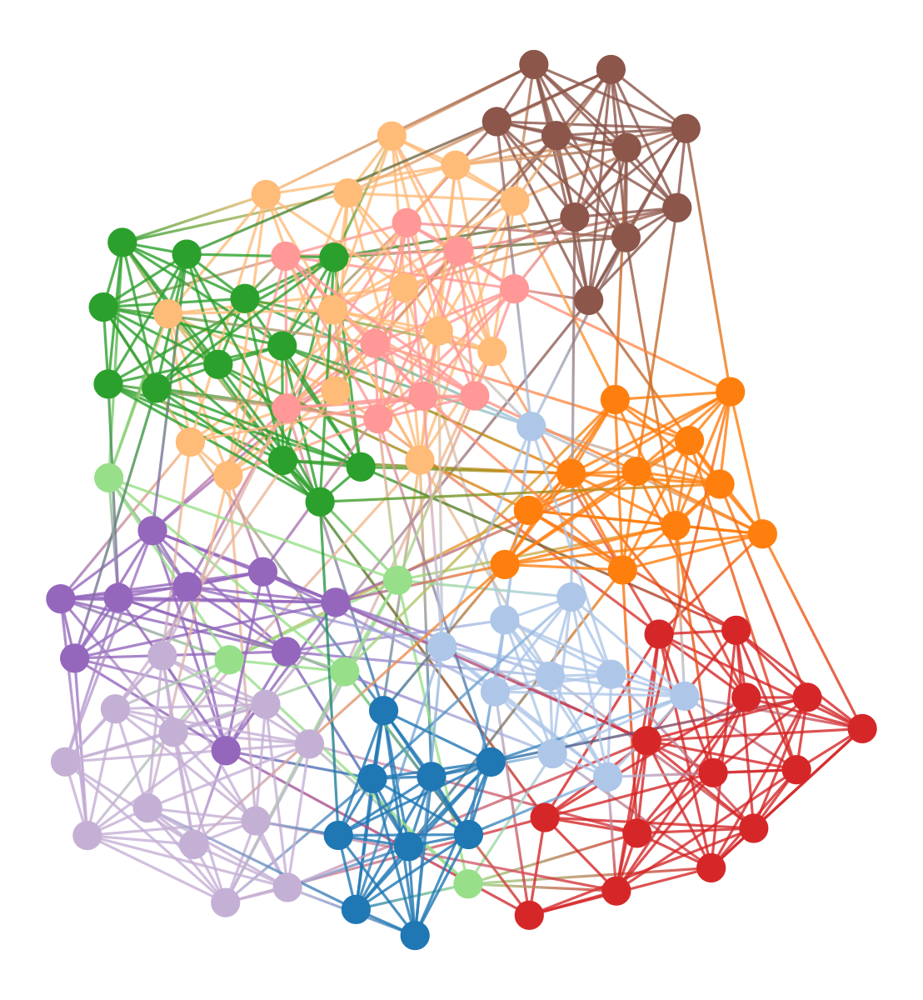

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x3589157f0, at 0x371aacb60>

In [87]:
# fit the model using a greedy heuristic
state = gt.minimize_blockmodel_dl(g)
# plot the result
state.draw()

We can also perform MCMC to get the full posterior distribution over the parameters, which is useful for uncertainty quantification.
As an example, let's track the marginal probability of a partition sampled from the posterior having $B$ groups.

In [145]:
g = gt.collection.ns['facebook_friends']

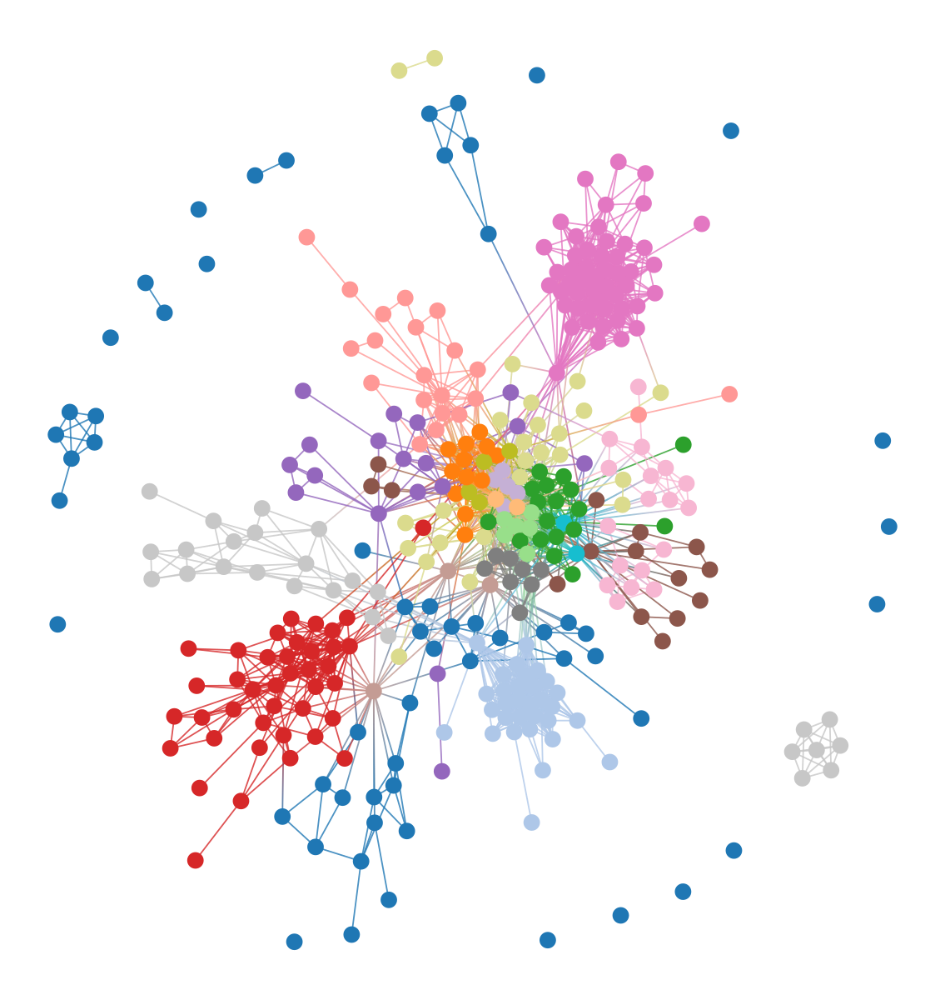

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x358fb5e50, at 0x3400ab8c0>

In [146]:
state = gt.minimize_blockmodel_dl(g)
state.draw()

In [ ]:
Bs = []
for _ in range(10000): # should take 2 min, decrease num samples for faster results
    state.multiflip_mcmc_sweep(niter=10)
    Bs.append(state.get_nonempty_B())

Text(0, 0.5, 'Frequency')

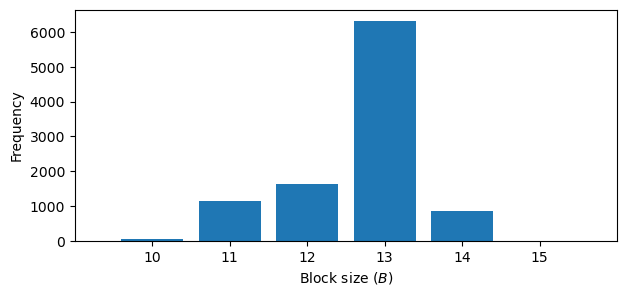

In [151]:
plt.figure(figsize=(7, 3))

plt.hist(Bs, bins=range(min(Bs), max(Bs)+2), align='left', rwidth=0.8)
plt.xlim([min(Bs)-1, max(Bs)+1])
plt.xticks(range(min(Bs), max(Bs)+1))
plt.xlabel('Block size ($B$)')
plt.ylabel('Frequency')


## Nested stochastic block models

The basic idea of the nest (or hierarchical) stochastic block model (hSBM) is to apply the SBM in an interative fashion, where the block graph at each level is itself modeled by another stochastic block model.
This allows for an improved resolution limit, allowing the model to find smaller communities than the standard SBM, if they exist in the data.

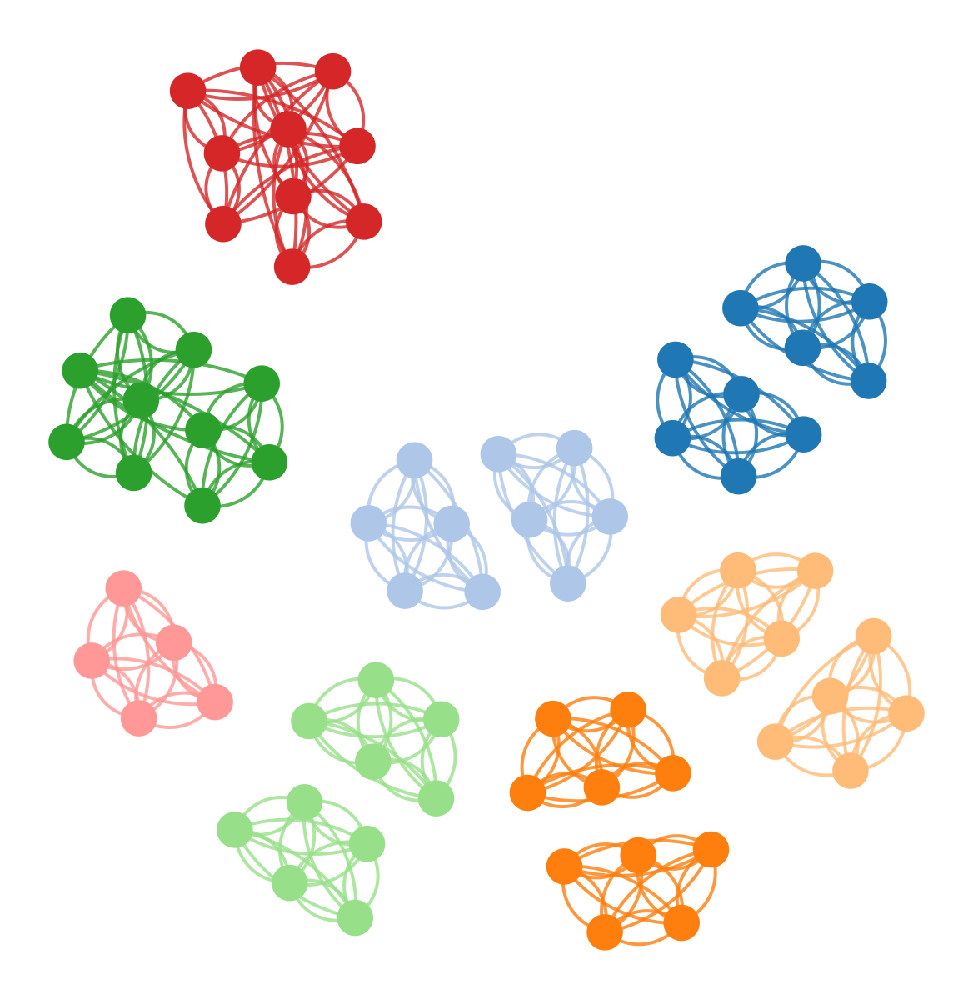

<Graph object, undirected, with 75 vertices and 300 edges, at 0x3323cbb90>

In [99]:
def multiclique(num_cliques, node_per_clique):

    g = gt.Graph(directed=False)
    for c in range(num_cliques):
        clique = list(g.add_vertex(node_per_clique))
        #print(list(clique))
        for v in clique:
            g.add_edge_list([(v, u) for u in clique if u != v])
    return g

g = multiclique(15, 5)

state = gt.minimize_blockmodel_dl(g)
pos = gt.sfdp_layout(g, groups = state.b,gamma=0.01,p=10)
#pos=None
state.draw(pos = pos)
g

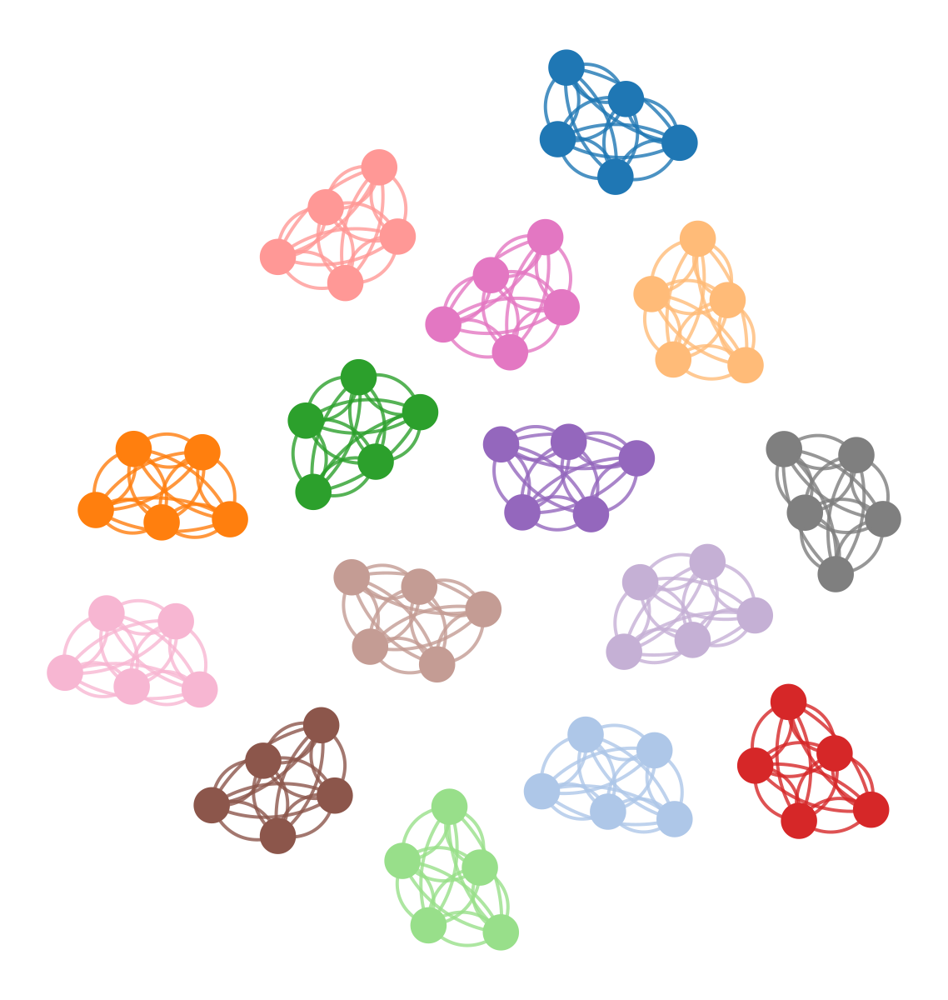

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x3323cbb90, at 0x33218dc40>

In [101]:
state = gt.minimize_nested_blockmodel_dl(g)
pos = gt.sfdp_layout(g, groups = state.get_levels()[0].b,gamma=0.01,p=10)
#pos=None
state.get_levels()[0].draw(pos = pos)

In [102]:
g = gt.collection.ns['openflights']

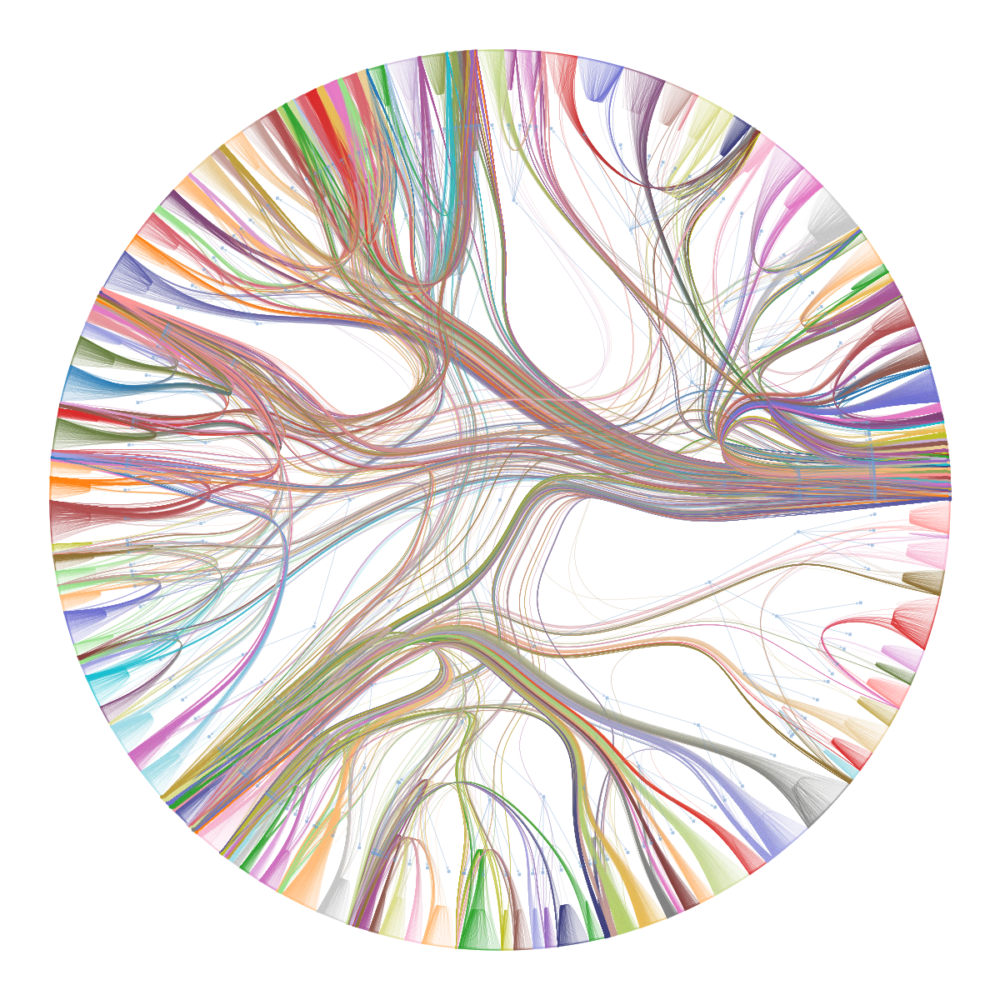

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x33218ca40, at 0x332af9070>,
 <GraphView object, directed, with 3530 vertices and 3529 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x330eceb70, at 0x3324dcc80>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x330eceb70, at 0x332afc260>, False), at 0x330eceb70>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x330eceb70, at 0x3324d52e0>)

In [ ]:
# this should take < 30 seconds
state = gt.minimize_nested_blockmodel_dl(g)
state.draw();

## Multilayer models

In [3]:
g = gt.collection.ns['law_firm']
list(g.ep.keys())

['weight', 'layer']

In [4]:
state = gt.LayeredBlockState(g, ec = g.ep.layer,layers=True)
state.multilevel_mcmc_sweep()

(-601.7428962808833, 716, 716)

In [ ]:
plt.switch_backend("cairo")   # to enable vector drawing
fig, axes = plt.subplots(1,3,figsize=(12,4))

pos = gt.sfdp_layout(state.g, groups=state.b, gamma=0.5)
for layer in set(state.g.ep.layer.a):
    # filter the graph to only show the current layer
    efilt = state.g.ep.layer.a == layer
    # create a new GraphView for the current layer
    g_layer = gt.GraphView(state.g, efilt=efilt)
    # copy over the partition property to the new graph
    b = g_layer.new_vertex_property('int', vals=state.b.a)
    # plot on the axes
    a = gt.graph_draw(g_layer, pos=pos, mplfig=axes[layer-1],vertex_fill_color=state.b)
    a.fit_view(yflip=True)
    # formatting
    axes[layer-1].set_title(f"Layer: {g.gp.layer_key[layer]}")
    axes[layer-1].set_axis_off()
plt.tight_layout()
plt.savefig("figures/law_firm_layers.png", dpi=300)


The figure above is shown here:
![image](figures/law_firm_layers.png)

## Weighted models

In [40]:
import graph_tool.all as gt
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

In [41]:
g = gt.collection.ns['cintestinalis']
g.ep.depth.a

PropertyArray([0.96, 0.12, 0.18, ..., 0.3 , 0.07, 0.07])

First, let's examine the weight distribution to see what model is most appropriate.

<Figure size 640x480 with 0 Axes>

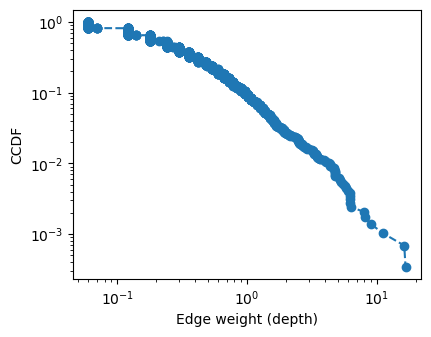

In [42]:
%matplotlib inline
plt.clf()
plt.figure(figsize=(4.5,3.5))
#plot ccdf
vals = np.sort(g.ep.depth.a)
ccdf = 1.0 - np.arange(len(vals)) / float(len(vals))
plt.plot(vals, ccdf, 'o--')
plt.xscale('log')
plt.yscale('log')
plt.xlabel("Edge weight (depth)")
plt.ylabel("CCDF");
plt.show();

<Figure size 640x480 with 0 Axes>

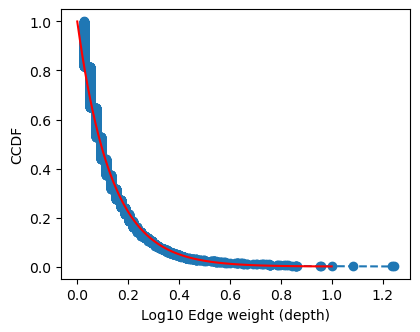

In [43]:
#plot log transformed data
plt.clf()
plt.figure(figsize=(4.5,3.5))
logvals = np.log10(vals + 1)
#logvals = vals
ccdf = 1.0 - np.arange(len(logvals)) / float(len(logvals))
plt.plot(logvals, ccdf, 'o--')
plt.xlabel("Log10 Edge weight (depth)")
plt.ylabel("CCDF");

# plot exponential pdf
x = np.linspace(0, 1, 100)
lam = np.mean(logvals)
ccdf = np.exp(- x/lam)
plt.plot(x, ccdf, label='Exponential PDF', color='red')
plt.show();


Looks like the exponential distribution fits the log transformed weights very well, meaning we had something resembling a power law beforhand. 

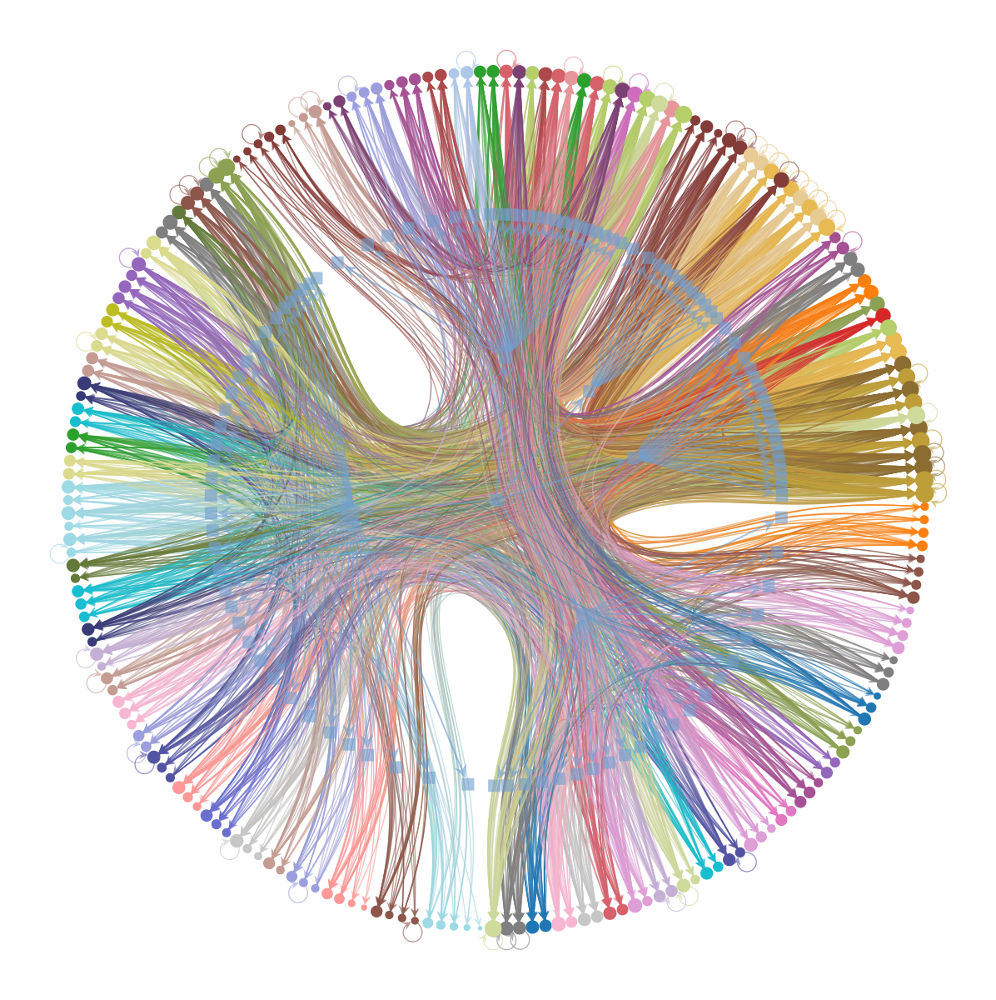

In [46]:
logvals =g.new_edge_property('double', vals = np.log10(g.ep.depth.a + 1))
state = gt.minimize_nested_blockmodel_dl(g, state_args = dict(recs=[logvals], rec_types=['real-exponential']))
state.draw();

## 

## Ordered stochastic block models

This model is designed to capture hierarchical structure in networks.

In [31]:
g = gt.collection.ns['foodweb_baywet']

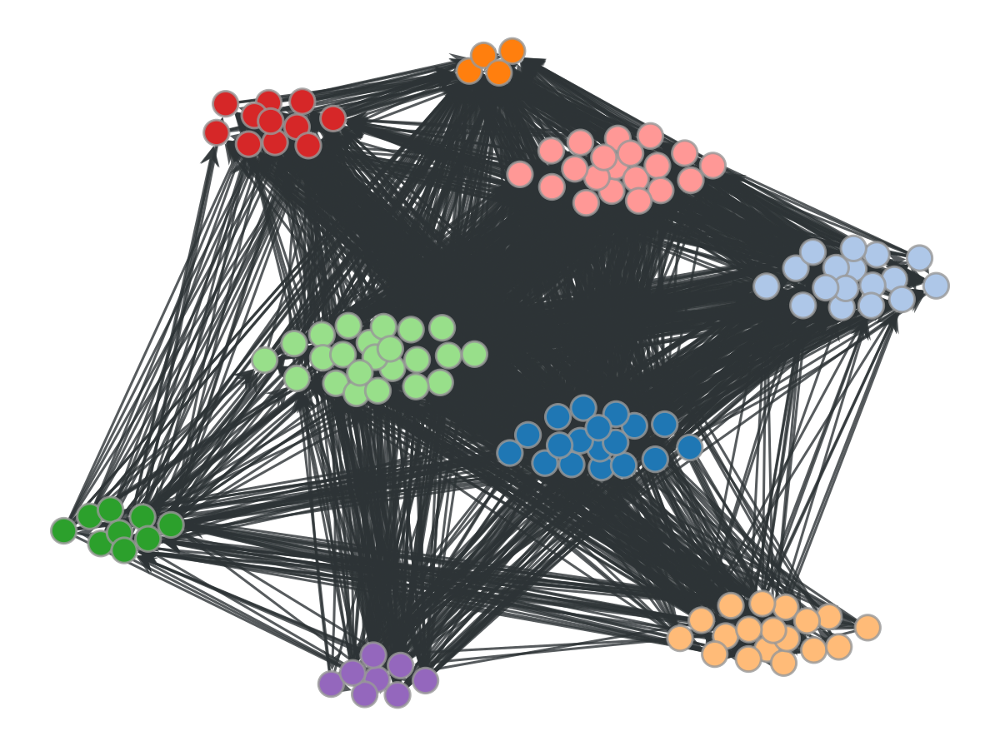

In [38]:
state = gt.NestedBlockState(g, base_type=gt.RankedBlockState)#, state_args=dict(eweight=ew))
state.multilevel_mcmc_sweep()
pos = gt.sfdp_layout(g, cooling_step=0.99, multilevel=False, R=20,
                     rmap=state.levels[0].get_vertex_order(),
                     groups=state.levels[0].b, gamma=1)
gt.graph_draw(g, pos=pos, vertex_fill_color=state.levels[0].b);

# Analyzing bipartite graphs

Bipartite graphs are everywhere.
Anytime people iteract with literally anything else: websites they visit, books they read, movies they watch, this is a bipartite graph.
Any hypergraph? That's a bipartite graph also.

SBM inference is naturally adaptable to the bipartite case, with two small changes.
1. We need to tell the model to never put nodes of different types in the same block. This is done by passing a VertexPropertyMap with the keyword`'clabel'`. This tells graph-tool to never propose moves in the MCMC that would put nodes of different types in the same block.
2. We need to change the computation of the description length to account for the fact that the bipartite graph has two types of nodes, and we do this by passing the same category vector to the model as `'pclabel`.

In [88]:
g = gt.collection.ns["foursquare/NYC_restaurant_checkin"]
# get bipartite labeling
bipartite = g.new_vertex_property('int', vals = g.vp.is_user.a) # bipartite label must be an int, not bool
print(bipartite.a.sum())

2060


5


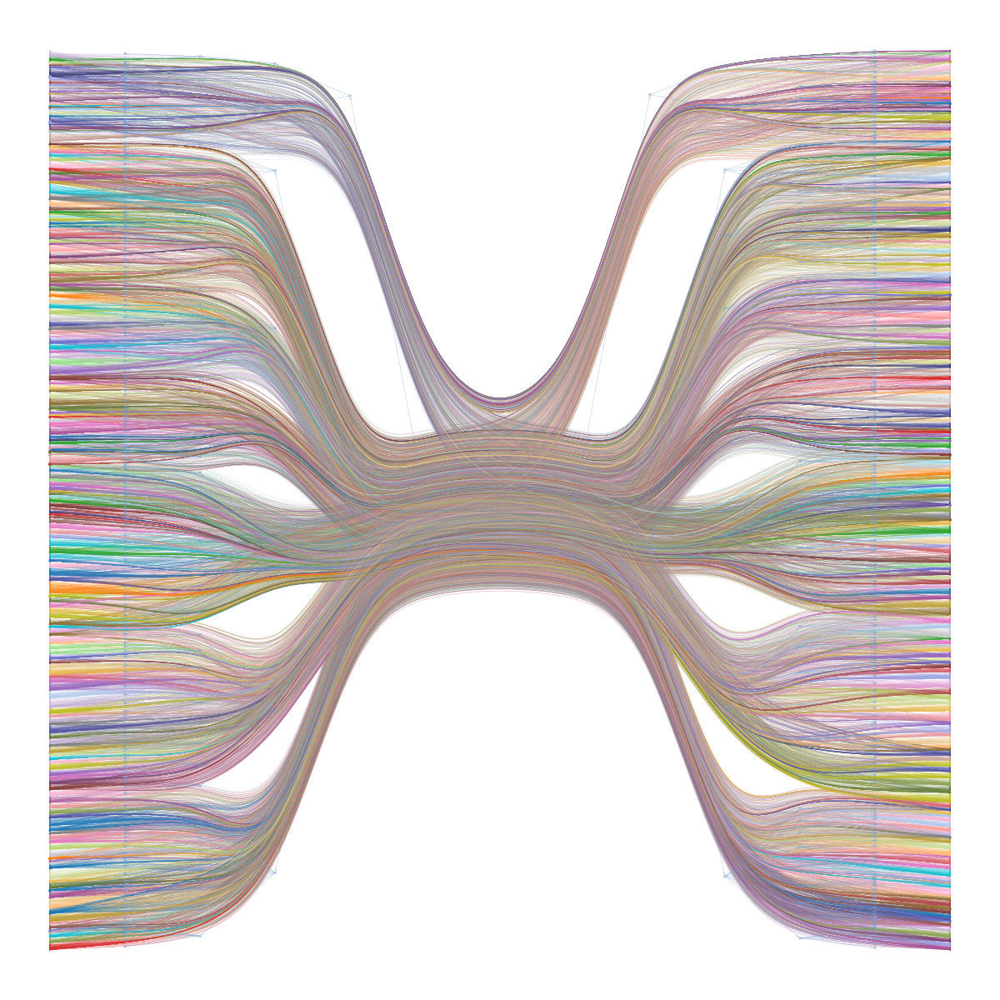

In [ ]:
# fit the model with bipartite constraints
state = gt.minimize_nested_blockmodel_dl(g,state_args=dict(clabel=bipartite, pclabel=bipartite))
# due to a random artifact of the MCMC. Prune the empty levels of the hierarchy
L = 0
for s in state.levels:
    L += 1
    if s.get_nonempty_B() == 2:
        break
state = state.copy(bs=state.get_bs()[:L] + [np.zeros(1)])
#draw with bipartite layout
state.draw(layout = 'bipartite');

# Network reconstruction

In [ ]:
import requests
from collections import defaultdict
import csv

r = requests.get('https://raw.githubusercontent.com/plotly/datasets/master/all_stocks_5yr.csv')
lines = r.iter_lines(decode_unicode=True)
next(lines)                                     # remove header
prices = defaultdict(list)
for vals in csv.reader(lines, delimiter=','):
    prices[vals[-1]].append(float(vals[4]))     # use closing price
stocks, s = zip(*[(stock, vals) for stock, vals in prices.items() if len(vals) == 1259])

# compute log-returns
s = [[np.log(p[i+1]) - np.log(p[i]) for i in range(len(p)-1)] for p in s]

s = np.array(s)

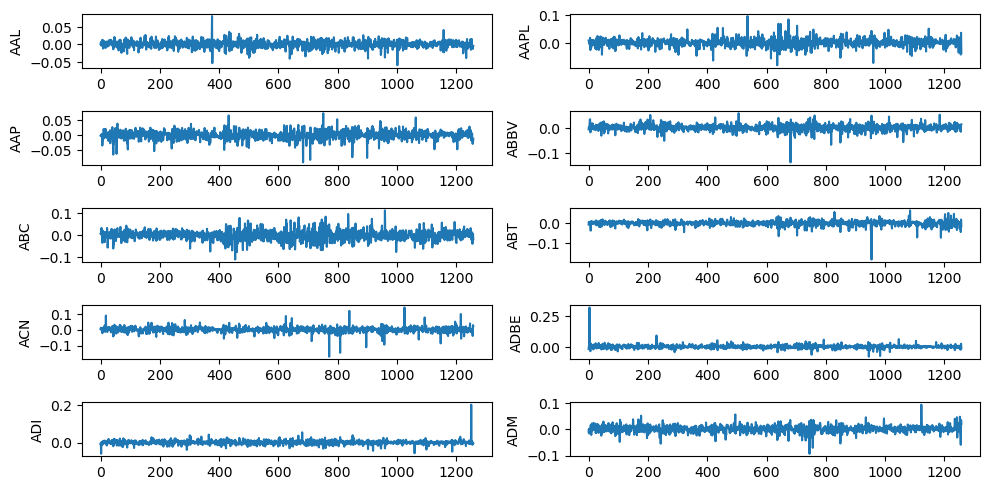

In [ ]:
s = s[np.random.choice(s.shape[0], 10, replace=False), :]
fig, ax = plt.subplots(5,2,figsize=(10,5))
for i in range(10):
    ax.flatten()[i].plot(s[i])
    ax.flatten()[i].set_ylabel(stocks[i])
plt.tight_layout()

In [ ]:
# shoudl take about five minutes
state = gt.PseudoNormalBlockState(s)

# Do an initial sweep over the edges before any other latent variable.
ret = state.edge_mcmc_sweep(niter=10)

delta = abs(ret[0])
while delta > 20:
    ret = state.mcmc_sweep(niter=10)
    delta = abs(ret[0])

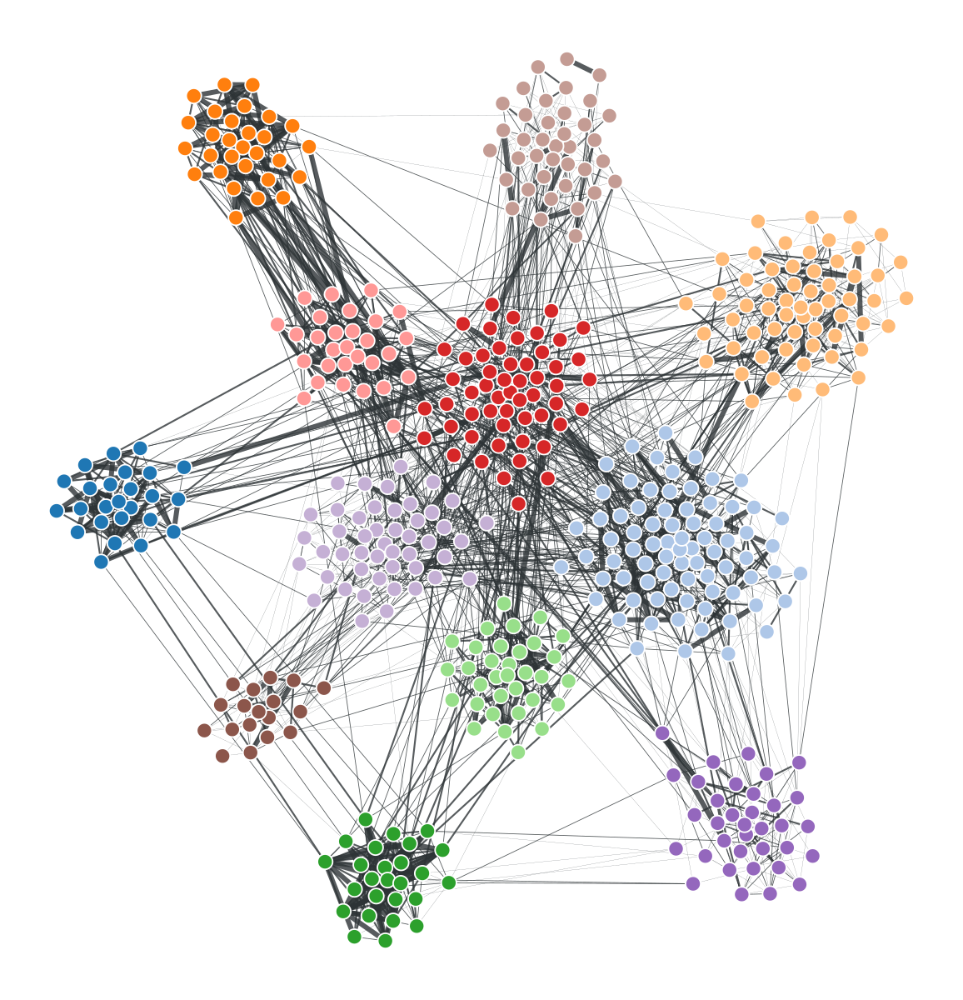

In [ ]:
bstate = state.get_block_state().levels[0]
pos = gt.sfdp_layout(state.get_graph(), groups=bstate.get_blocks(), gamma=.02) #uses blocks to position nodes
bstate.draw(pos=pos, vertex_color="white", edge_gradient=[],
            edge_pen_width=gt.prop_to_size(state.get_x().t(abs), .1, 3, power=1),
            output_size=(800, 600));